In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## Import module

In [4]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import torch
import os
from torchsummary import summary
from torchvision import transforms                                                                                                                                        
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
from PIL import Image

import sys
sys.path.append("../../../src/")
sys.path.append("../../")
import model
from datasets import imagenet
import config
from aux.utils import obtain_features_map, load_imgs, zscore, extract_valid
from aux.visualization import visualize_features_map_for_comparision

## Hyperparameter

In [5]:
backbone = "resnet18"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Load modal from dict

In [6]:
# model
net = model.Network(backbone=backbone, num_classes=1000)
net.to(device)

Network(
  (model): ResNet18(
    (resnet18): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm

In [7]:
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

## Load Original Data 

In [15]:
# Load data
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
reverse_mean = [-0.485, -0.456, -0.406]
reverse_std = [1/0.229, 1/0.224, 1/0.225]
train_transform = None
train_transform = transforms.Compose([                                                                                                                                
    transforms.Resize((224, 224), interpolation=Image.BILINEAR),                                                                                              
    # transforms.RandomCrop(input_size),                                                                                                                              
    # transforms.RandomHorizontalFlip(),                                                                                                                              
    # transforms.ColorJitter(brightness=0.4, saturation=0.4, hue=0.4),                                                                                                
    transforms.ToTensor(),                                                                                                                                            
    transforms.Normalize(mean, std)                                                                                                                                   
       ])         
trainset = imagenet.ImageNet(root="/media/lincolnzjx/HardDisk/Datasets/", is_train=True, transform=train_transform)

trainset.set_data([950], 30)
#image, label, imgs_path = trainset
imgs_path = []                                                                                                                                                            
images = []
labels = []
for img, label, img_path in trainset:                                                                                                                                     
    images.append(img.unsqueeze(0))                                                                                                                                       
    labels.append(label)                                                                                                                                                  
    imgs_path.append(img_path)  

Len of new dataset is :30


## Load optimized data from given path

In [16]:
save_dir = "/home/lincolnzjx/Desktop/Interpretation/saved/pack/"
################### Hyper-Parameter #######################
exp = "052400"
epoch = "67715"
##########################################################
ab_path = os.path.join(save_dir, exp, epoch)

In [17]:
# Load image
optimized_data, valid_imgs_path, valid_imgs_index = load_imgs(ab_path, imgs_path, non_exists_ok=True)
valid_imgs, valid_labels = extract_valid(images, labels, valid_imgs_index)
optimized_data = zscore(optimized_data, mean, std)

Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10061.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10068.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10110.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10134.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10162.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10166.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10178.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10179.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10184.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack/052400/67715/n07747607_10192.png
Load from /home/lincolnzjx/Desktop/Interpretation/saved/pack

In [18]:
index2image = {index: item.split("/")[-1].split(".")[0] for index, item in enumerate(valid_imgs_path)}
index2image

{0: 'n07747607_10061',
 1: 'n07747607_10068',
 2: 'n07747607_10110',
 3: 'n07747607_10134',
 4: 'n07747607_10162',
 5: 'n07747607_10166',
 6: 'n07747607_10178',
 7: 'n07747607_10179',
 8: 'n07747607_10184',
 9: 'n07747607_10192',
 10: 'n07747607_10204',
 11: 'n07747607_10205',
 12: 'n07747607_1021',
 13: 'n07747607_10213',
 14: 'n07747607_10217',
 15: 'n07747607_10232',
 16: 'n07747607_10258',
 17: 'n07747607_10290',
 18: 'n07747607_10305',
 19: 'n07747607_10345',
 20: 'n07747607_10358',
 21: 'n07747607_10379',
 22: 'n07747607_10420',
 23: 'n07747607_10425',
 24: 'n07747607_10436',
 25: 'n07747607_10465',
 26: 'n07747607_10482',
 27: 'n07747607_10485',
 28: 'n07747607_10491',
 29: 'n07747607_10545'}

In [20]:
# save_dict = {
#     "save_dir": "../saved/generated/"+ exp + "/feature_map/",
#     "index2image": index2image, 
#     "save_name": "layer-{}-{}.pdf"
# }
# 
# try: 
#     os.mkdir(save_dict["save_dir"])
# except FileExistsError:
#     print("Directory has been created {}".format(save_dict["save_dir"]))

In [21]:
# Move to device
opt_image = torch.from_numpy(optimized_data).to(device)
original_image = torch.cat(valid_imgs, dim=0).to(device)

## !! Visualization Here.

In [28]:
conv_output_indexes_dict = {0:0}
layer_index = 0
layer_name = "relu"
ori_activation_maps = net.get_activation_maps(original_image, layer_name)
opt_activation_maps = net.get_activation_maps(opt_image, layer_name)

visualize_features_map_for_comparision(img_index=12, layer_index=layer_index, 
                                       features_map=ori_activation_maps, 
                                       opt_feature_map=opt_activation_maps, 
                                       cols=4, 
                                       conv_output_index_dict=conv_output_indexes_dict, 
                                       save_dict=None, is_save=False,
                                       plt_mode="img_scale", 
                                       color_map = "nipy_spectral",
                                       layer_name=layer_name)

In [34]:
path = "../../../saved/pack/052400/67715/67715.npy"
opt_array = np.load(path)
opt_imgs = torch.from_numpy(optimized_data).to(device)

In [35]:
opt_imgs == opt_array

False

In [38]:
opt_imgs.shape

torch.Size([30, 3, 224, 224])

In [39]:
opt_array.shape

(30, 3, 224, 224)


resnet18
conv1
bn1
relu
=> Register fhook relu
maxpool
layer1
layer1.0
layer1.0.conv1
layer1.0.bn1
layer1.0.relu
layer1.0.conv2
layer1.0.bn2
layer1.1
layer1.1.conv1
layer1.1.bn1
layer1.1.relu
layer1.1.conv2
layer1.1.bn2
layer2
layer2.0
layer2.0.conv1
layer2.0.bn1
layer2.0.relu
layer2.0.conv2
layer2.0.bn2
layer2.0.downsample
layer2.0.downsample.0
layer2.0.downsample.1
layer2.1
layer2.1.conv1
layer2.1.bn1
layer2.1.relu
layer2.1.conv2
layer2.1.bn2
layer3
layer3.0
layer3.0.conv1
layer3.0.bn1
layer3.0.relu
layer3.0.conv2
layer3.0.bn2
layer3.0.downsample
layer3.0.downsample.0
layer3.0.downsample.1
layer3.1
layer3.1.conv1
layer3.1.bn1
layer3.1.relu
layer3.1.conv2
layer3.1.bn2
layer4
layer4.0
layer4.0.conv1
layer4.0.bn1
layer4.0.relu
layer4.0.conv2
layer4.0.bn2
layer4.0.downsample
layer4.0.downsample.0
layer4.0.downsample.1
layer4.1
layer4.1.conv1
layer4.1.bn1
layer4.1.relu
layer4.1.conv2
layer4.1.bn2
avgpool
fc

resnet18
conv1
bn1
relu
=> Register fhook relu
maxpool
layer1
layer1.0
layer1.0.

../../aux/visualization.py:107: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



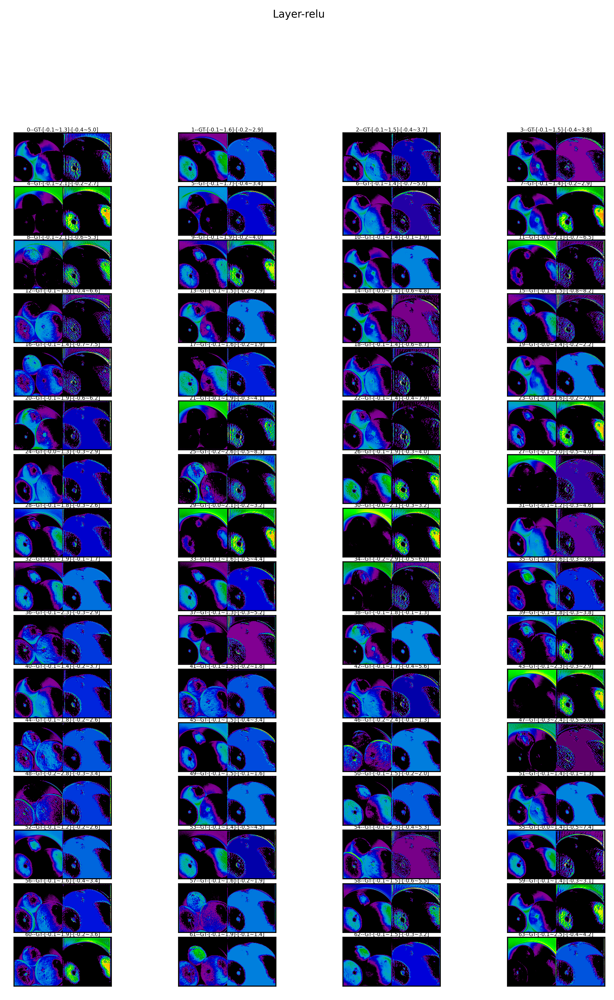

In [40]:
conv_output_indexes_dict = {0:0}
layer_index = 0
layer_name = "relu"
ori_activation_maps = net.get_activation_maps(original_image, layer_name)
opt_activation_maps = net.get_activation_maps(opt_imgs, layer_name)

visualize_features_map_for_comparision(img_index=12, layer_index=layer_index, 
                                       features_map=ori_activation_maps, 
                                       opt_feature_map=opt_activation_maps, 
                                       cols=4, 
                                       conv_output_index_dict=conv_output_indexes_dict, 
                                       save_dict=None, is_save=False,
                                       plt_mode="img_scale", 
                                       color_map = "nipy_spectral",
                                       layer_name=layer_name)

array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, Fa